<a href="https://colab.research.google.com/github/quarcs-lab/project2025s/blob/master/notebooks/c03_spatial_dependence_lisa.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab" /></a>

This notebook examines spatial dependence in nighttime luminosity across 520 Indian districts using Local Indicators of Spatial Association (LISA). We apply Local Moran's I to both the initial level and the growth rate of luminosity per capita, and visualize the results as cluster maps identifying statistically significant spatial clusters (HH, LL) and outliers (HL, LH).

## Setup

In [1]:
# Google Colab: install packages not included in the default environment
try:
    import google.colab
    !pip install contextily pyogrio -q
except ImportError:
    pass  # Local environment — packages already installed

In [2]:
# Importing necessary libraries for data analysis and visualization
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg  # Importing matplotlib image for image plotting
import matplotlib.colors as mcolors
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

# Importing libraries for spatial data and visualization
import geopandas as gpd
import folium
from folium import Figure

import contextily as cx

import libpysal
from libpysal  import weights

# Exploratory Spatial Data Analysis (ESDA) tools
import mapclassify as mc
import esda
from esda.moran import Moran, Moran_Local

# Spatial plotting tools
import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster, plot_local_autocorrelation
from splot.libpysal import plot_spatial_weights
from splot.mapping import vba_choropleth

# Statistical modeling
import statsmodels.api as sm
import statsmodels.formula.api as smf

import warnings
warnings.filterwarnings('ignore')


RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

## Data

We load district geometries and nighttime lights variables from the GeoPackage, which already contains the 520-district sample merged with all analysis variables.

In [3]:
# Load data from GitHub
import urllib.request, tempfile, os
url = "https://raw.githubusercontent.com/quarcs-lab/project2025s/master/data/maps/india_2001_520.gpkg"
temp_gpkg = os.path.join(tempfile.gettempdir(), "india_2001_520.gpkg")
urllib.request.urlretrieve(url, temp_gpkg)
gdf = gpd.read_file(temp_gpkg, engine="pyogrio")

In [4]:
# Rename key variables for convenience
gdf = gdf.rename(columns={
    "newdata_light_growth96_10rcr_cap": "growth",
    "newdata_log_light96_rcr_cap": "log_initial",
    "NAME2_": "district",
})

# Convert from string to numeric (GeoPackage stores these as text)
gdf["growth"] = pd.to_numeric(gdf["growth"], errors="coerce")
gdf["log_initial"] = pd.to_numeric(gdf["log_initial"], errors="coerce")

print(f"Districts: {len(gdf)}")
gdf[["district", "growth", "log_initial"]].describe()

Districts: 520


,growth,log_initial
count,520.000000,520.000000
mean,0.023523,-4.818477
std,0.043073,1.093441
min,-0.095267,-8.468901
25%,-0.001208,-5.488250
50%,0.022962,-4.549616
75%,0.037141,-3.952151
max,0.282837,-2.182392


The interactive choropleth below maps per capita luminosity growth across all 520 districts. Hover over individual districts to inspect their values.

In [5]:
# Visualize spatial data using the explore() method of a GeoDataFrame
gdf.explore(
    # Specify the column to visualize on the map
    column='growth',
    # Specify the attributes to display in the tooltip when hovering over map features
    tooltip=['district', 'log_initial', 'growth'],
    # Choose the classification scheme for data visualization
    scheme='fisherjenks',
    # Specify the number of classes for classification
    k=5,
    # Choose the colormap for data visualization
    cmap='coolwarm',
    # Specify whether to display a legend
    legend=True,
    # Choose the basemap tiles provider
    tiles='CartoDB positron',
    # Customize the style of the basemap tiles
    style_kwds=dict(color="gray", weight=0.5),
    # Customize the appearance of the legend
    legend_kwds=dict(colorbar=False)
)

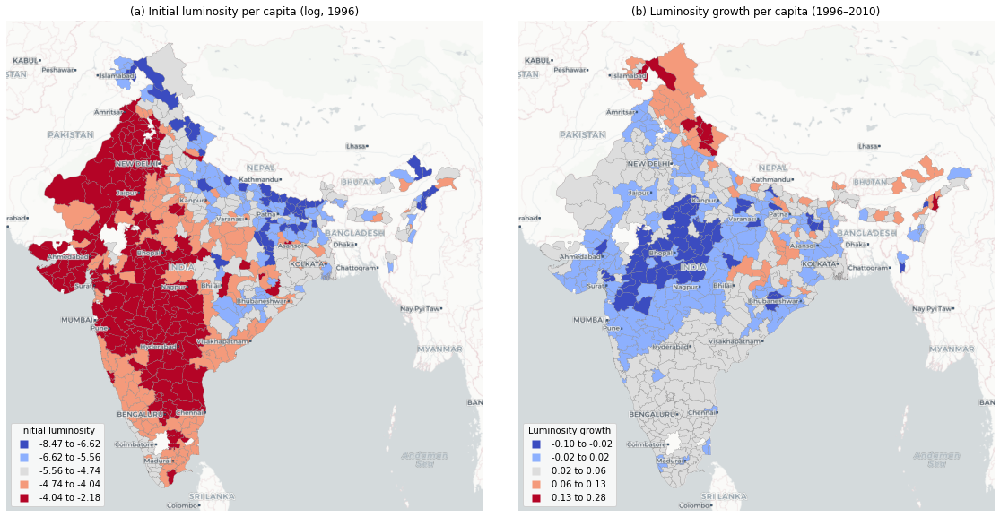

In [6]:
#| label: fig-chorophleths
#| fig-cap: "Spatial distribution of initial luminosity and luminosity growth <br> Notes: Districts are classified into five categories using Fisher-Jenks natural breaks. Panel (a) shows log of luminosity per capita in 1996. Panel (b) shows luminosity growth per capita over 1996–2010. <br> Source: Data from Chanda and Kabiraj (2020). See [Spatial dependence](notebooks/c03_spatial_dependence_lisa.ipynb) notebook for source code."


# Reproject once to Web Mercator for basemap overlay
_gdf = gdf.to_crs(epsg=3857).copy()

# Classify both variables (Fisher-Jenks, k=5)
clf_init = mc.FisherJenks(_gdf["log_initial"], k=5)
clf_growth = mc.FisherJenks(_gdf["growth"], k=5)

_gdf["init_class"] = clf_init.yb
_gdf["growth_class"] = clf_growth.yb

# Discrete colormap with 5 bins (close to the interactive map style)
cmap = plt.get_cmap("coolwarm", 5)
bounds = np.arange(-0.5, 5.5, 1)
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Plot: two panels
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Left: initial luminosity (log)
_gdf.plot(
    column="init_class",
    cmap=cmap,
    norm=norm,
    linewidth=0.25,
    edgecolor="gray",
    ax=ax[0],
)
cx.add_basemap(ax[0], source=cx.providers.CartoDB.Positron, attribution=False)
cx.add_basemap(ax[0], source=cx.providers.CartoDB.PositronOnlyLabels, attribution=False)
ax[0].set_axis_off()
ax[0].set_title("(a) Initial luminosity per capita (log, 1996)")

# Right: growth
_gdf.plot(
    column="growth_class",
    cmap=cmap,
    norm=norm,
    linewidth=0.25,
    edgecolor="gray",
    ax=ax[1],
)
cx.add_basemap(ax[1], source=cx.providers.CartoDB.Positron, attribution=False)
cx.add_basemap(ax[1], source=cx.providers.CartoDB.PositronOnlyLabels, attribution=False)
ax[1].set_axis_off()
ax[1].set_title("(b) Luminosity growth per capita (1996–2010)")

# Legends (one per panel, with variable-specific breaks)
handles = [
    plt.Line2D([0], [0], marker='s', linestyle='', markersize=9,
               markerfacecolor=cmap(i), markeredgecolor='none')
    for i in range(5)
]

# Left legend labels
init_min = float(_gdf["log_initial"].min())
init_labels = [
    f"{(clf_init.bins[i-1] if i>0 else init_min):.2f} to {clf_init.bins[i]:.2f}"
    for i in range(5)
]
ax[0].legend(handles, init_labels, title="Initial luminosity", loc="lower left", frameon=True)

# Right legend labels
growth_min = float(_gdf["growth"].min())
growth_labels = [
    f"{(clf_growth.bins[i-1] if i>0 else growth_min):.2f} to {clf_growth.bins[i]:.2f}"
    for i in range(5)
]
ax[1].legend(handles, growth_labels, title="Luminosity growth", loc="lower left", frameon=True)

plt.tight_layout()
plt.show()

## Spatial weights and lags

We construct a 6 nearest neighbors (6NN) spatial weights matrix from the district geometries and row-normalize it, consistent with the weights used in the main econometric analysis.

We reproject the geometries to an India-specific CRS (EPSG:7755) for proper basemap overlay, then compute the spatial lag of each variable---the weighted average of neighboring districts' values.

In [7]:
# Generate and export weight matrix
W = weights.KNN.from_dataframe(gdf, k=6, ids = 'Census_no')
W_matrix, ids = W.full()
df_W_matrix = pd.DataFrame(W_matrix)
df_ids = pd.DataFrame({'polyID': ids})
try:
    df_W_matrix.to_csv('../data/W_matrix.csv', index = False)
    df_W_matrix.to_stata('../data/W_matrix.dta', write_index = False)
except OSError:
    pass  # Skip file export when running in Colab
print(f"Weights: {W.n} observations, mean neighbors = {W.mean_neighbors:.1f}")

Weights: 520 observations, mean neighbors = 6.0


In [8]:
#  Row-standardize W
W.transform = 'r'

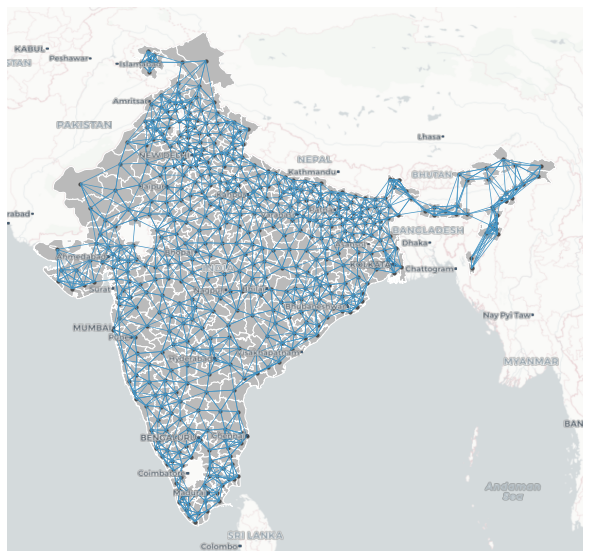

In [9]:
#| label: fig-Wmatrix6nn
#| fig-cap: "Spatial connectivity structure based on six nearest neighbors <br> Notes: Each node represents a district centroid. Each edge connects a district to one of its six geographically closest neighbors. The weight matrix is row-standardized. <br> Source: Data from Chanda and Kabiraj (2020). See [Spatial dependence](notebooks/c03_spatial_dependence_lisa.ipynb) notebook for source code."

# Plot the spatial weights matrix
# This will visualize the spatial relationships between observations defined by the weights matrix W
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(14,10))
plot_spatial_weights(W, gdf, indexed_on='Census_no', ax=ax)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron, attribution=False)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.PositronOnlyLabels, attribution=False)
ax.set_axis_off()
plt.show()

In [10]:
# Calculate spatial lag of INDICATOR1 using the specified weights
gdf['Wlog_initial'] = weights.lag_spatial(W, gdf['log_initial'])
gdf['Wgrowth']      = weights.lag_spatial(W, gdf['growth'])

## Spatial dependence for initial (log) luminosity

Global Moran's I summarizes the overall degree of spatial autocorrelation across all districts. Values near +1 indicate strong positive clustering; values near 0 indicate spatial randomness.

In [11]:
# Create a scatter plot using Plotly Express
px.scatter(
    gdf,
    x='log_initial',                               # Data for the x-axis
    y='Wlog_initial',                              # Data for the y-axis
    hover_name='district',                  # Display district name in hover tooltip
    hover_data=['district', 'log_initial', 'Wlog_initial'],    # Additional data to display in hover tooltip
    trendline="ols",                        # Add an ordinary least squares (OLS) trendline
    marginal_x="box",                       # Display marginal box plot on the x-axis
    marginal_y="box"                       # Display marginal box plot on the y-axis
)

In [12]:
# Compute Global Moran's I statistic for the 'log_initial' variable using the spatial weights matrix W
globalMoran = Moran(gdf['log_initial'], W)

# Format Moran's I statistic to two decimal places
moranI1 = "{:.2f}".format(globalMoran.I)

# Print Moran's I statistic
moranI1

'0.73'

While Global Moran's I captures the overall pattern, Local Moran's I (LISA) identifies *where* significant clusters and outliers are located. Each district is classified into one of four quadrants: High-High (HH, red), Low-Low (LL, blue), High-Low (HL, orange), or Low-High (LH, light blue). The Moran scatterplot shows all districts by quadrant, while the cluster map reveals their geographic distribution.

In [13]:
print(globalMoran.p_sim)

0.001


In [14]:
# Calculate Local Moran's I statistics
moranLocal = Moran_Local(gdf['log_initial'], W, permutations=999, seed=12345)

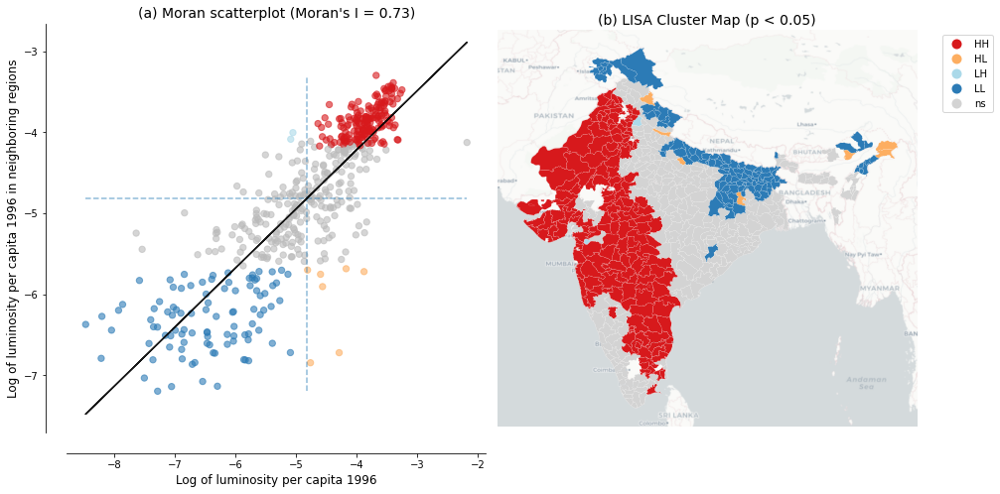

In [15]:
#| label: fig-dependence-initial
#| fig-cap: "Spatial dependence in the initial level of luminosity <br> Notes: Panel (a) shows the Moran scatterplot with Global Moran's I statistic. Panel (b) shows the LISA cluster map with statistically significant clusters at p < 0.05 based on 999 permutations. <br> Source: Data from Chanda and Kabiraj (2020). See [Spatial dependence](notebooks/c03_spatial_dependence_lisa.ipynb) notebook for source code."

# Initialize the subplots
f, ax = plt.subplots(1, 2, figsize=(14, 7))

# 1. Plot Moran Scatterplot and customize labels
moran_scatterplot(moranLocal, p=0.05, zstandard=False, aspect_equal=f, ax=ax[0])
ax[0].set_title(f"(a) Moran scatterplot (Moran's I = {moranI1})", fontsize=14)
ax[0].set_xlabel("Log of luminosity per capita 1996", fontsize=12)
ax[0].set_ylabel("Log of luminosity per capita 1996 in neighboring regions", fontsize=12)

# 2. Plot LISA Cluster map and customize title
lisa_cluster(moranLocal, gdf, p=0.05, 
             legend_kwds={'bbox_to_anchor':(1.05, 1), 'loc': 'upper left'}, 
             ax=ax[1])
ax[1].set_title("(b) LISA Cluster Map (p < 0.05)", fontsize=14)

# 3. Add basemap to the cluster map
cx.add_basemap(ax[1], 
               crs=gdf.crs.to_string(), 
               source=cx.providers.CartoDB.Positron, 
               attribution=False)

# Optional: Remove axes ticks for the map to make it cleaner
ax[1].set_axis_off()

plt.tight_layout()
try:
    plt.savefig("../images/lisaMAP1.png", dpi=150, bbox_inches='tight')
except OSError:
    pass  # Skip file export when running in Colab
plt.show()

## Spatial dependence for luminosity growth

Global Moran's I for growth confirms significant positive spatial autocorrelation. We proceed to the local analysis.

In [16]:
# Create a scatter plot using Plotly Express
px.scatter(
    gdf,
    x='growth',                               # Data for the x-axis
    y='Wgrowth',                              # Data for the y-axis
    hover_name='district',                  # Display district name in hover tooltip
    hover_data=['district', 'growth', 'Wgrowth'],    # Additional data to display in hover tooltip
    trendline="ols",                        # Add an ordinary least squares (OLS) trendline
    marginal_x="box",                       # Display marginal box plot on the x-axis
    marginal_y="box"                       # Display marginal box plot on the y-axis
)

In [17]:
# Compute Global Moran's I statistic for the 'growth' variable using the spatial weights matrix W
globalMoran2 = Moran(gdf['growth'], W)

# Format Moran's I statistic to two decimal places
moranI2 = "{:.2f}".format(globalMoran2.I)

# Print Moran's I statistic
moranI2

'0.60'

In [18]:
print(globalMoran2.p_sim)

0.001


The LISA cluster map for growth reveals the geographic pattern of convergence dynamics: HH clusters mark regions where both the district and its neighbors grew fast, while LL clusters identify persistently slow-growing areas. Together with the initial luminosity results above, these local patterns support the use of spatial econometric models to account for spatial spillovers in the convergence process.

In [19]:
# Calculate Local Moran's I statistics
moranLocal2 = Moran_Local(gdf['growth'], W, permutations=999, seed=12345)

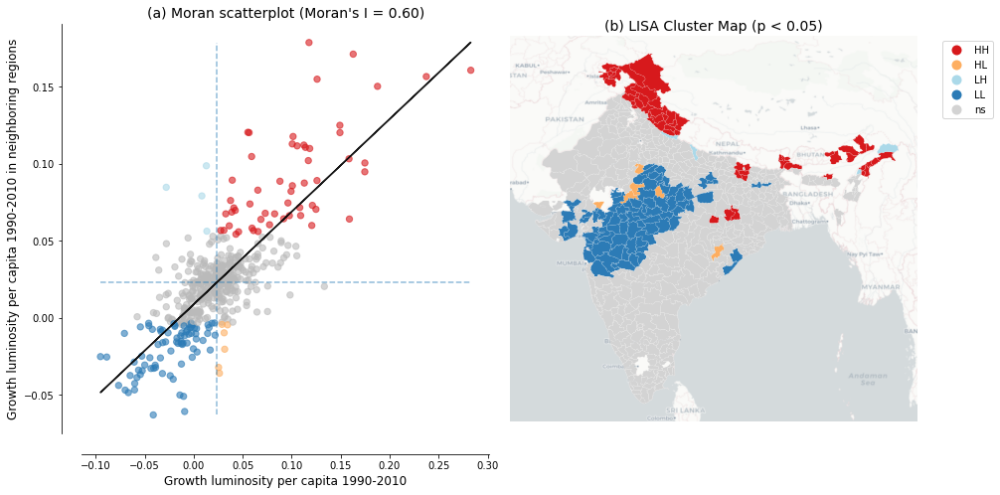

In [20]:
#| label: fig-dependence-growth
#| fig-cap: "Spatial dependence in the growth rate of luminosity <br> Notes: Panel (a) shows the Moran scatterplot with Global Moran's I statistic. Panel (b) shows the LISA cluster map with statistically significant clusters at p < 0.05 based on 999 permutations. <br> Source: Data from Chanda and Kabiraj (2020). See [Spatial dependence](notebooks/c03_spatial_dependence_lisa.ipynb) notebook for source code."


# Initialize the subplots
f, ax = plt.subplots(1, 2, figsize=(14, 7))

# 1. Plot Moran Scatterplot and customize labels
moran_scatterplot(moranLocal2, p=0.05, zstandard=False, aspect_equal=f, ax=ax[0])
ax[0].set_title(f"(a) Moran scatterplot (Moran's I = {moranI2})", fontsize=14)
ax[0].set_xlabel("Growth luminosity per capita 1990-2010", fontsize=12)
ax[0].set_ylabel("Growth luminosity per capita 1990-2010 in neighboring regions", fontsize=12)

# 2. Plot LISA Cluster map and customize title
lisa_cluster(moranLocal2, gdf, p=0.05, 
             legend_kwds={'bbox_to_anchor':(1.05, 1), 'loc': 'upper left'}, 
             ax=ax[1])
ax[1].set_title("(b) LISA Cluster Map (p < 0.05)", fontsize=14)

# 3. Add basemap to the cluster map
cx.add_basemap(ax[1], 
               crs=gdf.crs.to_string(), 
               source=cx.providers.CartoDB.Positron, 
               attribution=False)

# Optional: Remove axes ticks for the map to make it cleaner
ax[1].set_axis_off()

plt.tight_layout()
try:
    plt.savefig("../images/lisaMAP2.png", dpi=150, bbox_inches='tight')
except OSError:
    pass  # Skip file export when running in Colab
plt.show()